In [7]:
pip install scikit-image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 120.9 kB/s eta 0:00:0000:0100:04
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 120.8 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.4/219.4 kB 171.0 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.2/313.2 kB 154.0 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 125.7 kB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import io, util
import heapq

In [17]:
def calculate_error(patch, length, overlap, res, y, x):
    
    error = 0
    if x > 0:
        left = patch[:, :overlap] - res[y:y+length, x:x+overlap]
        error += np.sum(left**2)
    if y > 0:
        up   = patch[:overlap, :] - res[y:y+overlap, x:x+length]
        error += np.sum(up**2)
    if x > 0 and y > 0:
        corner = patch[:overlap, :overlap] - res[y:y+overlap, x:x+overlap]
        error -= np.sum(corner**2)

    return error

In [ ]:
def RandomPatch(texture, length):
    height, weight, _ = texture.shape
    i = np.random.randint(height - length)
    j = np.random.randint(weight - length)
    return texture[i:i+length, j:j+length]

In [18]:
def RandomBestPatch(texture, length, overlap, res, y, x):
    height, weight, _ = texture.shape
    errors = np.zeros((height - length, weight - length))

    for i in range(height - length):
        for j in range(weight - length):
            patch = texture[i:i+length, j:j+length]
            e = calculate_error(patch, length, overlap, res, y, x)
            errors[i, j] = e

    i, j = np.unravel_index(np.argmin(errors), errors.shape)
    return texture[i:i+length, j:j+length]

In [19]:
def minCutPath(errors):
    pq = [(error, [i]) for i, error in enumerate(errors[0])]
    heapq.heapify(pq)

    height, weight = errors.shape
    seen = set()

    while pq:
        error, path = heapq.heappop(pq)
        curDepth = len(path)
        curIndex = path[-1]

        if curDepth == height:
            return path

        for delta in -1, 0, 1:
            nextIndex = curIndex + delta

            if 0 <= nextIndex < weight:
                if (curDepth, nextIndex) not in seen:
                    cumError = error + errors[curDepth, nextIndex]
                    heapq.heappush(pq, (cumError, path + [nextIndex]))
                    seen.add((curDepth, nextIndex))

In [20]:
def minCutPatch(patch, overlap, res, y, x):
    patch = patch.copy()
    dy, dx, _ = patch.shape
    minCut = np.zeros_like(patch, dtype=bool)

    if x > 0:
        left = patch[:, :overlap] - res[y:y+dy, x:x+overlap]
        leftL2 = np.sum(left**2, axis=2)
        for i, j in enumerate(minCutPath(leftL2)):
            minCut[i, :j] = True

    if y > 0:
        up = patch[:overlap, :] - res[y:y+overlap, x:x+dx]
        upL2 = np.sum(up**2, axis=2)
        for j, i in enumerate(minCutPath(upL2.T)):
            minCut[:i, j] = True

    np.copyto(patch, res[y:y+dy, x:x+dx], where=minCut)

    return patch

In [22]:
def quilt(texture, length, numPatches, mode="cut"):
    texture = util.img_as_float(texture)

    overlap = length // 6
    numPatchesHigh, numPatchesWide = numPatches

    h = (numPatchesHigh * length) - (numPatchesHigh - 1) * overlap
    w = (numPatchesWide * length) - (numPatchesWide - 1) * overlap

    res = np.zeros((h, w, texture.shape[2]))

    for i in range(numPatchesHigh):
        for j in range(numPatchesWide):
            y = i * (length - overlap)
            x = j * (length - overlap)

            if i == 0 and j == 0 or mode == "random":
                patch = RandomPatch(texture, length)
            elif mode == "best":
                patch = RandomBestPatch(texture, length, overlap, res, y, x)
            elif mode == "cut":
                patch = RandomBestPatch(texture, length, overlap, res, y, x)
                patch = minCutPatch(patch, overlap, res, y, x)
            
            res[y:y+length, x:x+length] = patch
      
    return res

In [25]:
def process(texture, patchLength):
    plt.figure(figsize=(20, 15))
    plt.subplot(221), plt.imshow(texture), plt.title('Original')
    plt.subplot(222), plt.imshow(quilt(texture, patchLength, (6, 6), 'random')), plt.title('Random placement of blocks')
    plt.subplot(223), plt.imshow(quilt(texture, patchLength, (6, 6), 'best')), plt.title('Neighboring blocks constrained by overlap')
    plt.subplot(224), plt.imshow(quilt(texture, patchLength, (6, 6), 'cut')), plt.title('Minimal error boundary cut')

The provided code performs texture synthesis using the quilting algorithm. Here's a breakdown of each function:

1. `calculate_error`: This function calculates the error between the patch and the overlapping regions in the result image (`res`). It considers the left, up, and corner regions and computes the sum of squared differences.

2. `RandomPatch`: This function selects a random patch of a specified length from the texture.

3. `RandomBestPatch`: This function finds the best patch by iterating over possible patches and calculating the error using `calculate_error`. It returns the patch with the minimum error.

4. `minCutPath`: This function finds the minimum cut path in a given array of errors. It uses Dijkstra's algorithm to find the path with the lowest cumulative error.

5. `minCutPatch`: This function applies the minimum cut path to the patch by setting the corresponding pixels to the values in the result image (`res`) if they belong to the cut region.

6. `quilt`: This function performs texture synthesis by iteratively placing patches on the result image. It uses either random placement, best placement with overlap constraints, or minimal error boundary cut based on the specified mode.

7. `process`: This function visualizes the texture synthesis process by displaying the original texture and the synthesized textures using different modes.

Overall, the code utilizes various techniques such as random patch selection, error calculation, overlap constraints, and minimum cut paths to create visually coherent and realistic synthesized textures.

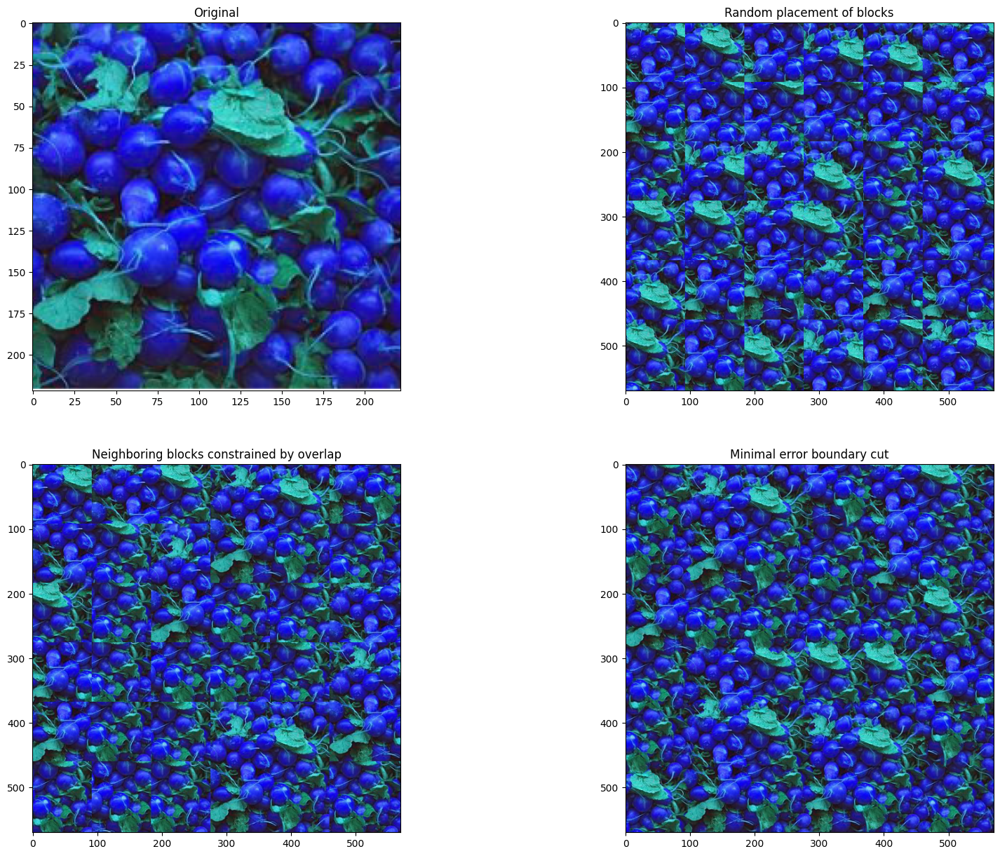

In [26]:
texture1 = cv2.imread('Images/texture1.png')
process(texture1, 110)

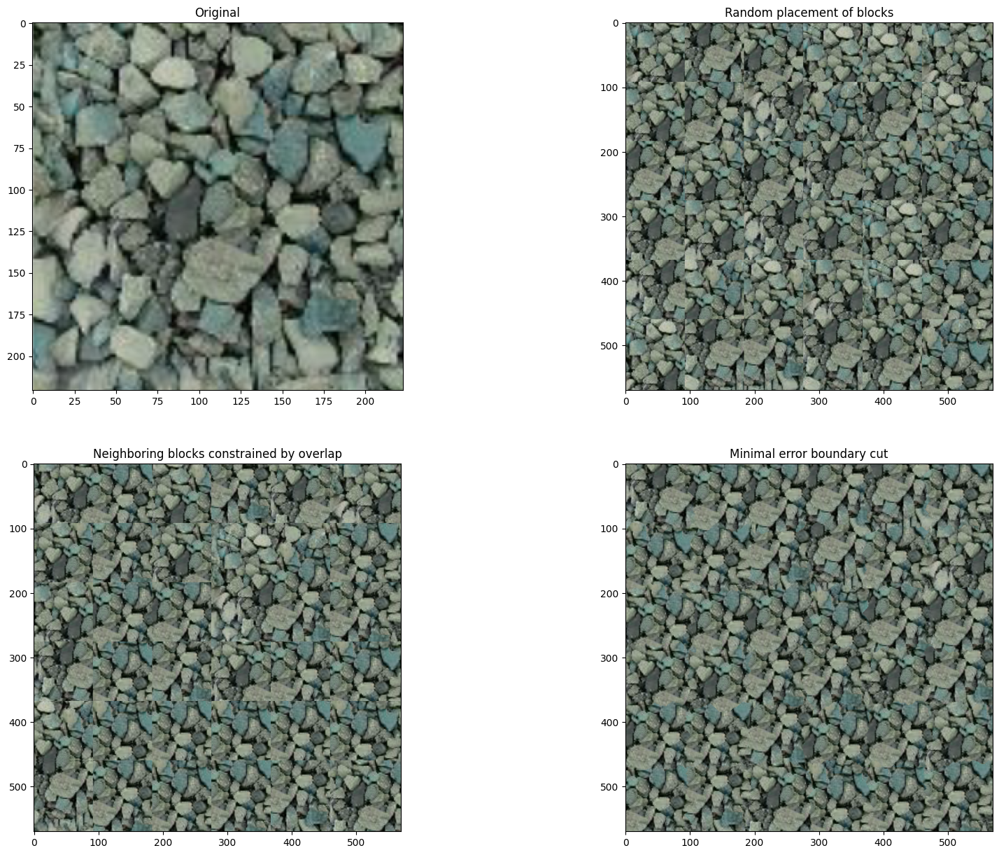

In [27]:
texture2 = cv2.imread('Images/texture2.png')
process(texture2, 110)

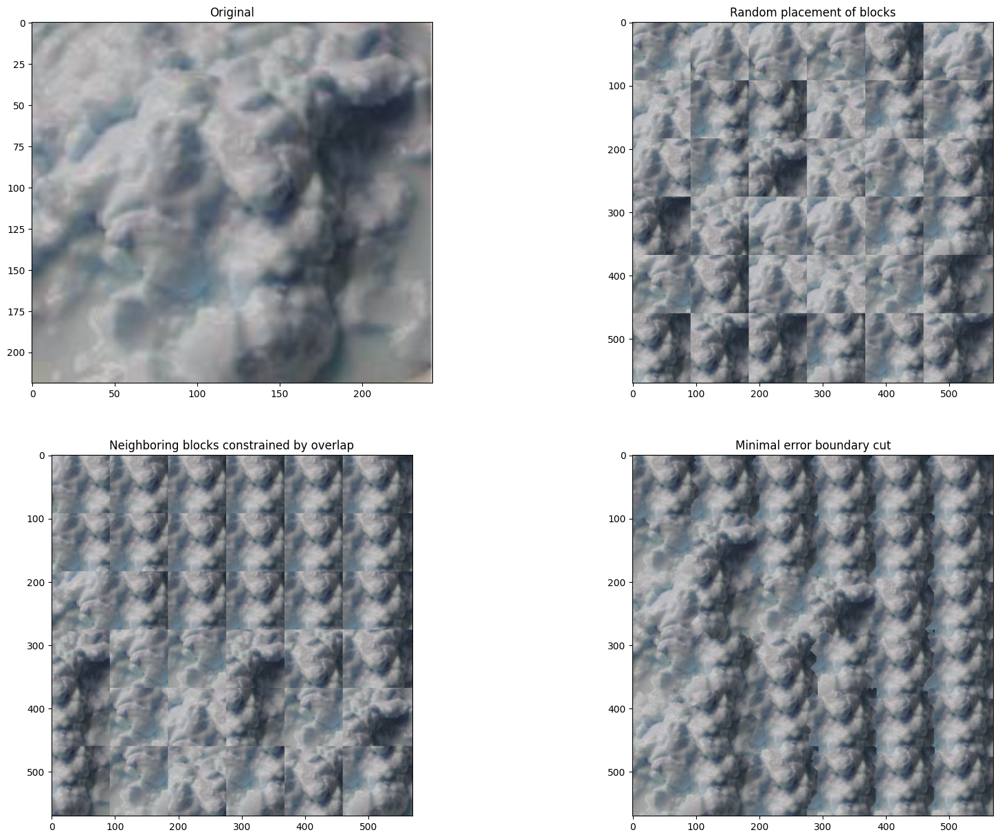

In [28]:
texture3 = cv2.imread('Images/texture3.png')
process(texture3, 110)

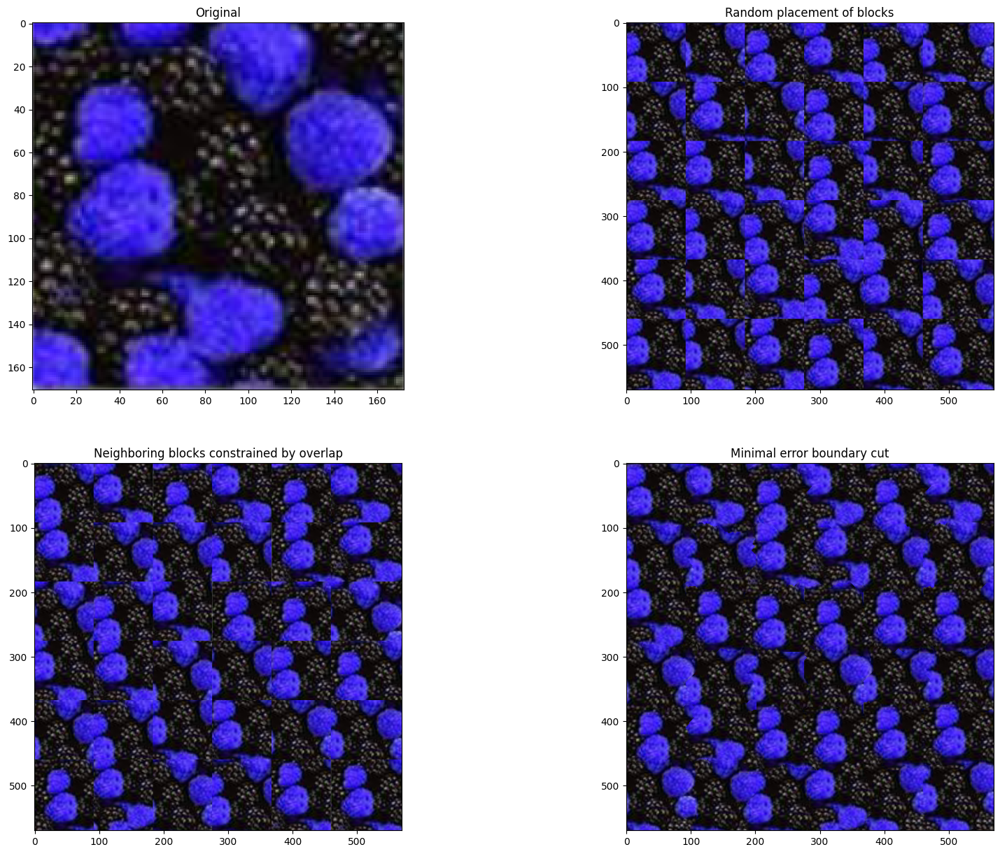

In [31]:
texture4 = cv2.imread('Images/texture4.png')
process(texture4, 110)